<a href="https://colab.research.google.com/github/edoofra/FaceMaskDetection/blob/main/FaceMaskDetectionWithYOLOv5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Face Mask Detection
Sistema di rilevamento automatico di mascherine utilizzando YOLOv5. 
Allenamento della Deep CNN tramite Transfer Learning, inizialmente addestrando solamente il livello finale di classificazione, successivamente sbloccando anche gli ultimi 5 livelli dell'architettura YOLO.

Valutazione finale del modello tramite inferenza su immagini di test standard e immagini di me e la mia ragazza.

Dataset utilizzato per il training: https://universe.roboflow.com/joseph-nelson/mask-wearing

# Step 1: Install Requirements

In [ ]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  
%cd yolov5
%pip install -qr requirements.txt 
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 14799, done.
remote: Counting objects: 100% (130/130), done.
remote: Compressing objects: 100% (83/83), done.
remote: Total 14799 (delta 75), reused 92 (delta 47), pack-reused 14669
Receiving objects: 100% (14799/14799), 13.61 MiB | 18.00 MiB/s, done.
Resolving deltas: 100% (10217/10217), done.
/content/yolov5
     |████████████████████████████████| 1.6 MB 35.6 MB/s 
     |████████████████████████████████| 41 kB 181 kB/s 
     |████████████████████████████████| 145 kB 56.0 MB/s 
     |████████████████████████████████| 67 kB 6.1 MB/s 
     |████████████████████████████████| 54 kB 2.9 MB/s 
     |████████████████████████████████| 138 kB 63.6 MB/s 
     |████████████████████████████████| 178 kB 54.7 MB/s 
     |████████████████████████████████| 62 kB 1.3 MB/s 
Setup complete. Using torch 1.12.1+cu113 (Tesla T4)


In [ ]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

rf = Roboflow(api_key="6Ew7xIsb7r08gquT6Og1")
project = rf.workspace("joseph-nelson").project("mask-wearing")
dataset = project.version(18).download("yolov5")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/Mask-Wearing-18 in yolov5pytorch:: 100%|██████████| 10340/10340 [00:03<00:00, 3339.50it/s]


#Train the model YOLOv5m

Inizio allenando solamente il layer finale di classificazione, al fine di non distruggere la rete già allenata tramite backpropagation di pesi inizializzati in modo casuale.
Una volta allenato anche l'ultimo layer sarà poi possibile sbloccare alcuni livelli al fine di consentire la backprop e quindi un addestramento più profondo che coinvolga anche la backbone.

In [ ]:
!python train.py --batch 16 --epochs 10 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache --freeze 24

train: weights=yolov5s.pt, cfg=, data=/content/datasets/Mask-Wearing-18/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[24], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-239-gf33718f Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv

Dopo aver allenato solamente l'ultimo livello, sblocco alcuni dei livelli freezati in modo da consentire un allenamento più profondo della rete.


In [ ]:
!python train.py --batch 16 --epochs 10 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache --freeze 20

train: weights=yolov5s.pt, cfg=, data=/content/datasets/Mask-Wearing-18/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[20], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-239-gf33718f Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv

# Evaluate Custom YOLOv5 Detector Performance with Tensorboard


In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

#Run Inference  With Trained Weights on your images

In [ ]:
!python detect.py --weights runs/train/exp2/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images --line-thickness 1 

detect: weights=['runs/train/exp2/weights/best.pt'], source=/content/datasets/Mask-Wearing-18/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-239-gf33718f Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/137 /content/datasets/Mask-Wearing-18/test/images/0209-00176-076b1_jpg.rf.4e758b94facd762dd24c8886794f2ef5.jpg: 416x416 6 masks, 1 no-mask, 8.2ms
image 2/137 /content/datasets/Mask-Wearing-18/test/images/0450908675_50159485_mutation-virus-chine-inquietude_jpg.rf.b5855673a6fdeaa2f6dd9c029801023d.jpg: 416x416 2 m

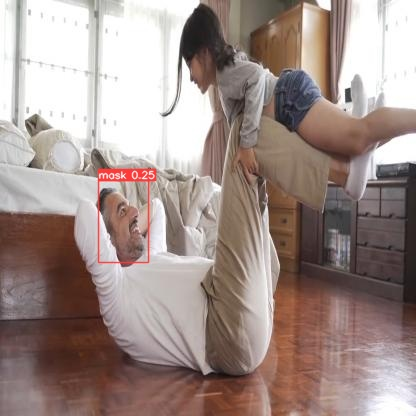

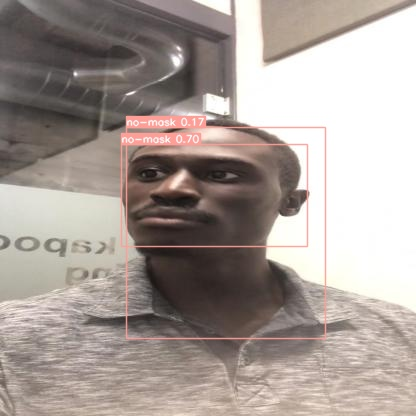

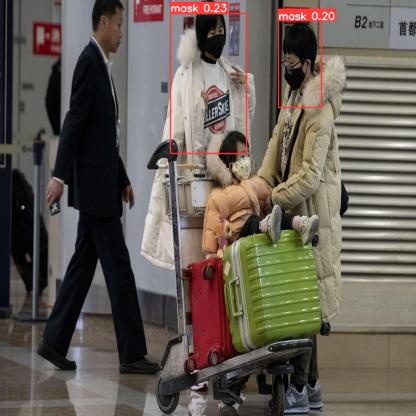

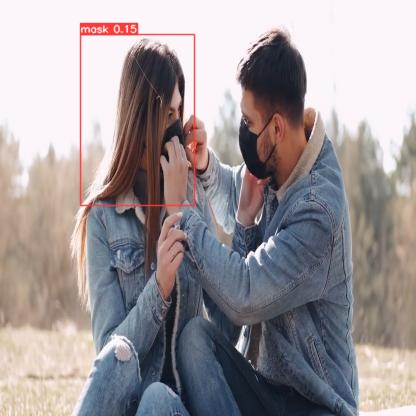

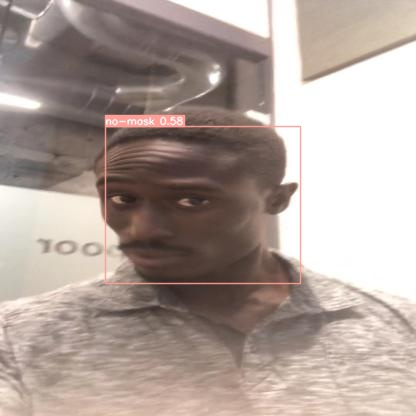

...

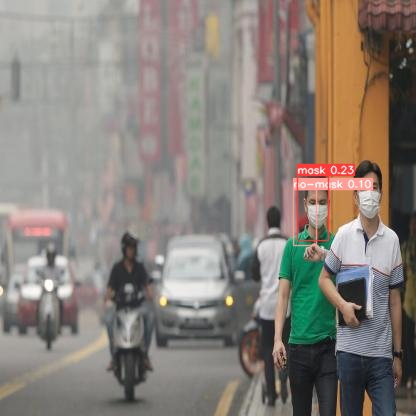

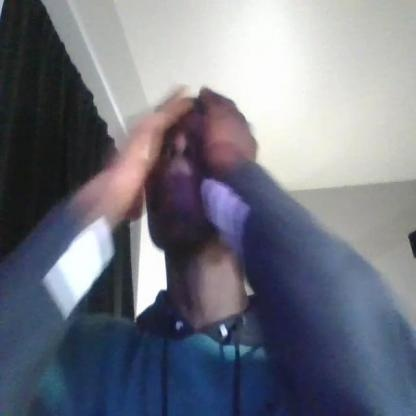

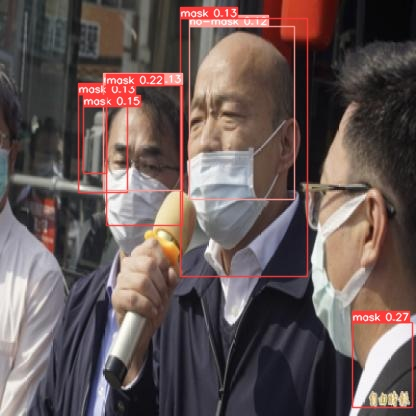

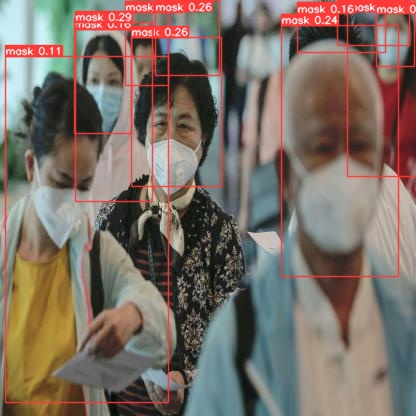

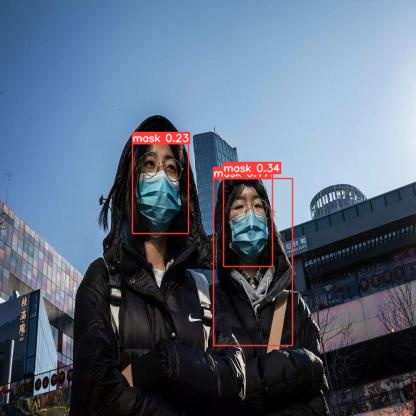

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp4/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
!python detect.py --weights runs/train/exp3/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/customTest --line-thickness 1 

detect: weights=['runs/train/exp3/weights/best.pt'], source=/content/datasets/Mask-Wearing-18/customTest, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-239-gf33718f Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/4 /content/datasets/Mask-Wearing-18/customTest/IMG_0637.jpeg: 416x416 2 masks, 8.6ms
image 2/4 /content/datasets/Mask-Wearing-18/customTest/IMG_1383.jpeg: 416x416 1 mask, 1 no-mask, 9.8ms
image 3/4 /content/datasets/Mask-Wearing-18/customTest/IMG_1400.jpeg: 416x416 1 mask, 1 no-mask, 8.9ms
image 4/4 /content/dat

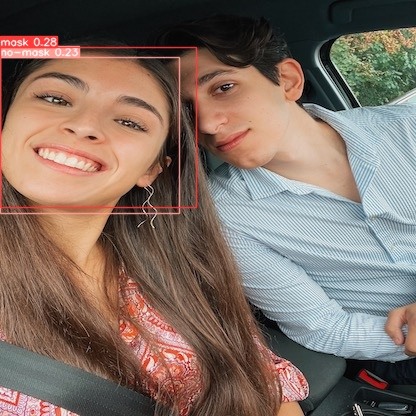

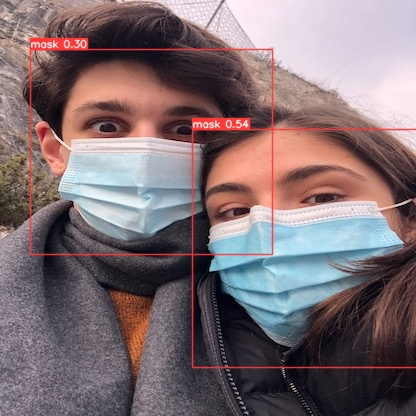

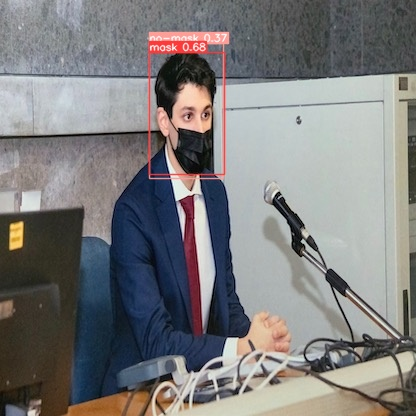

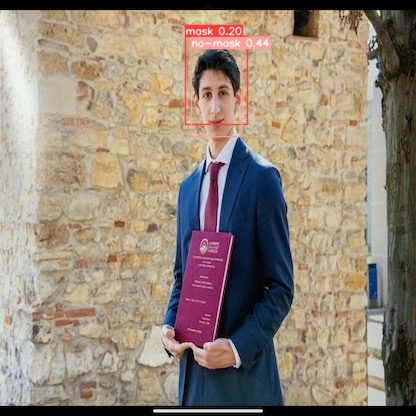

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp7/*.jpeg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")